<a href="https://colab.research.google.com/github/sourcecode369/deep-nlp/blob/master/image%20captioning/Image_Captioning_with_Visual_Attention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from __future__ import absolute_import, print_function, division, unicode_literals
from builtins import range, input

In [2]:
#%tensorflow_version 2.x
%pip install tensorflow==2.15.0
import tensorflow as tf
import matplotlib.pyplot as plt
%pip install matplotlib inline
#%matplotlib inline

from sklearn.model_selection import train_test_split 
from sklearn.utils import shuffle

import re
import json
import os
import time
from PIL import Image
import pickle

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
#%matplotlib inline

import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip



Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
annontation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.')+annontation_folder):
  annotation_zip = tf.keras.utils.get_file('captions.zip',
                                           cache_subdir=os.path.abspath('.'),
                                           origin = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                           extract = True
                                          )
  annotation_file = os.path.dirname(annotation_zip) + '/annotations/captions_train2014.json'
  os.remove(annotation_zip)

image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='http://images.cocodataset.org/zips/train2014.zip',
                                      extract=True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder 

In [4]:
#already on computer
annotation_file = os.path.abspath('.') + '/annotations/captions_train2014.json'

In [5]:
with open(annotation_file, 'r') as f:
  annotations = json.load(f)

In [6]:
all_captions = []
all_image_name_vector = []
for annot in annotations['annotations']:
  caption = '<start>' + annot['caption'] + '<end>'
  image_id = annot['image_id']
  full_coco_image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (image_id)
  all_image_name_vector.append(full_coco_image_path)
  all_captions.append(caption)

In [7]:
train_captions, img_name_vector = shuffle(all_captions, all_image_name_vector, random_state=1)

In [8]:
num_examples = 30000
train_captions = train_captions[:num_examples]
img_name_vector = img_name_vector[:num_examples]

In [9]:
def load_image(image_path):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_jpeg(img,channels=3)
  img = tf.image.resize(img, (299,299))
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  return img, image_path

In [10]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input 
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

NEXT CELL HAVE A CELL FOR TESTING IF THERE ISE ALREADY NPY FILES

In [11]:
from tqdm import tqdm, tqdm_notebook
encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
    load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16).prefetch(tf.data.experimental.AUTOTUNE)
for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode('utf-8')
    np.save(path_of_feature, bf.numpy())

  3%|▎         | 52/1622 [01:24<42:22,  1.62s/it]


KeyboardInterrupt: 

In [11]:
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import os

encode_train = sorted(set(img_name_vector))

for img_path in tqdm(encode_train):
    feature_path = img_path + '.npy'
    
    if not os.path.exists(feature_path):
        img, _ = load_image(img_path)
        batch_features = image_features_extract_model(tf.expand_dims(img, 0))
        batch_features = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
        
        np.save(feature_path, batch_features.numpy())


  0%|          | 0/25950 [00:00<?, ?it/s]

100%|██████████| 25950/25950 [00:01<00:00, 13892.38it/s]


In [12]:
def calc_max_length(tensor):
  return max(len(t) for t in tensor)

In [13]:
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k, 
                                                  oov_token="<unk>", 
                                                  filters='!"#$%^&*()?/.,:;][{}\|`~+_=-]')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [14]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [15]:
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [16]:
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')
max_length = calc_max_length(train_seqs)

In [17]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector, 
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(24000, 24000, 6000, 6000)

In [18]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 512
units = 1024
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE

feature_shape = 2048
attention_features_shape = 64

In [19]:
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8') + '.npy')
  return img_tensor, cap

In [20]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [21]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
    attention_weights = tf.nn.softmax(self.V(score), axis=1)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    return context_vector, attention_weights

In [22]:
class CNN_Encoder(tf.keras.Model):
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        self.fc = tf.keras.layers.Dense(embedding_dim)
    
    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [23]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units
    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)
    self.attention = BahdanauAttention(self.units)
  
  def call(self, x, features, hidden):
    context_vector, attention_weights = self.attention(features, hidden)
    x = self.embedding(x)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
    output, state = self.gru(x)
    x = self.fc1(output)
    x = tf.reshape(x, (-1, x.shape[2]))
    x = self.fc2(x)
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [24]:
encoder = CNN_Encoder(embedding_dim=embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [25]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)
  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask
  return tf.reduce_mean(loss_)

In [26]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [27]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  ckpt.restore(ckpt_manager.latest_checkpoint)

In [28]:
print(start_epoch)

5


In [29]:
loss_plot = []

In [30]:
@tf.function
def train_step(img_tensor, target):
  loss = 0
  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
  with tf.GradientTape() as tape:
      features = encoder(img_tensor)
      for i in range(1, target.shape[1]):
          predictions, hidden, _ = decoder(dec_input, features, hidden)
          loss += loss_function(target[:, i], predictions)
          dec_input = tf.expand_dims(target[:, i], 1)
  total_loss = (loss / int(target.shape[1]))
  trainable_variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss, trainable_variables)
  optimizer.apply_gradients(zip(gradients, trainable_variables))
  return loss, total_loss

In [31]:
EPOCHS = 25
if start_epoch==5:
  EPOCHS=5

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    loss_plot.append(total_loss / num_steps)
    if epoch % 5 == 0:
      ckpt_manager.save()
    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

In [32]:
def evaluate(image):
  hidden = decoder.reset_state(batch_size=1)
  temp_input = tf.expand_dims(load_image(image)[0],0)
  img_tensor_val = image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
  features = encoder(img_tensor_val)
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
  result = []
  for i in range(max_length):
    predictions, hidden, _ = decoder(dec_input, features, hidden)
    predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
    result.append(tokenizer.index_word[predicted_id])
    if tokenizer.index_word[predicted_id] == "<end>":
      return result
    dec_input = tf.expand_dims([predicted_id],0)
  return result

In [33]:
def evaluate_image_from_path(image_path):
    result = evaluate(image_path)
    print('Prediction Caption:', ' '.join(result))
    image = Image.open(image_path)
    plt.imshow(image)
    plt.show()

Predicting caption for boy and winnie.jpg
Prediction Caption: baby sitting in a big living room <end>


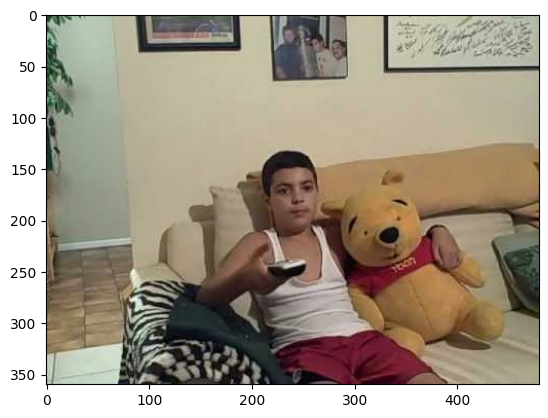

Predicting caption for bus.jpg
Prediction Caption: red double decker bus driving down a road <end>


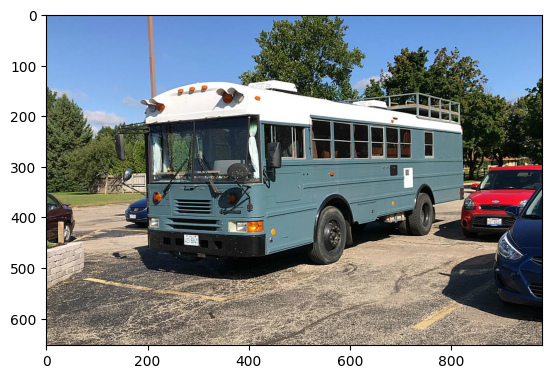

Predicting caption for cake.jpg
Prediction Caption: piece of cake that is on a metal pan <end>


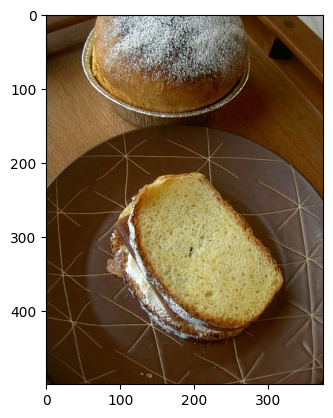

Predicting caption for cakee.jpg
Prediction Caption: shrimp with cut in be open and tools with chocolate cheese cake on them <end>


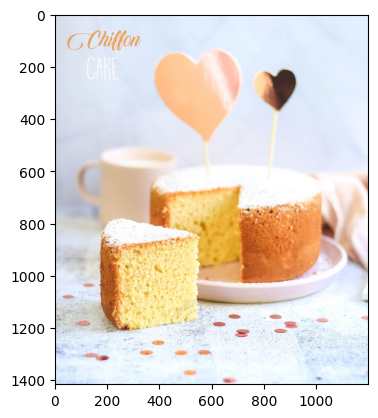

Predicting caption for cake_chocolate.jpg
Prediction Caption: chicken and two sandwiches that contains meats and ice cream with several cakes and a small <unk> sitting on a plate <end>


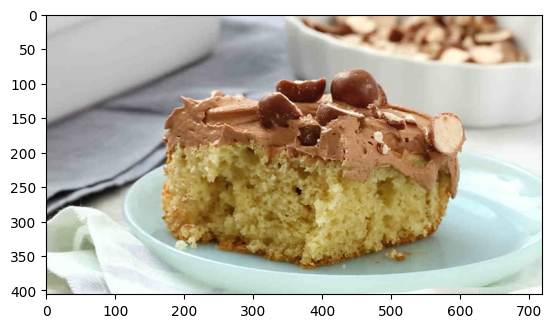

Predicting caption for cars.jpeg
Prediction Caption: very short shirts driving on and motorcycles beneath a freeway <end>


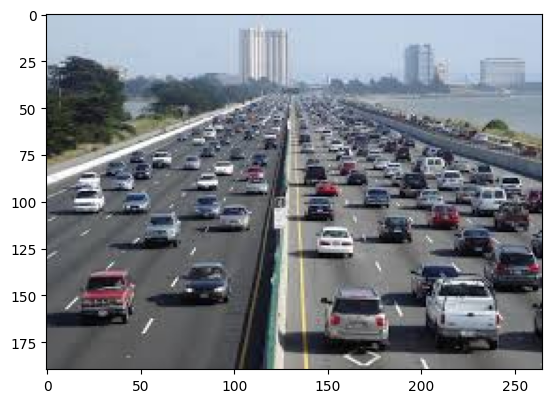

Predicting caption for cat and plate.jpg
Prediction Caption: eating a cat sitting on a table next to a bowl of cereal <end>


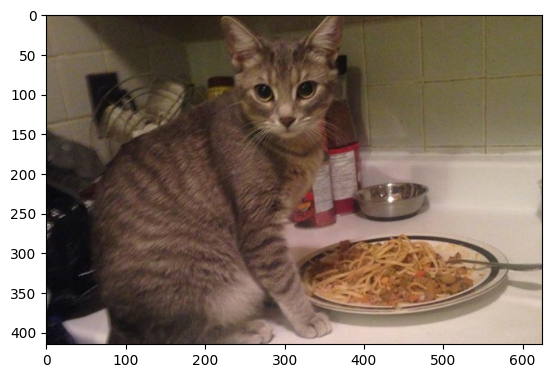

Predicting caption for cat on bed.jpg
Prediction Caption: kitten laying on top of a bed <end>


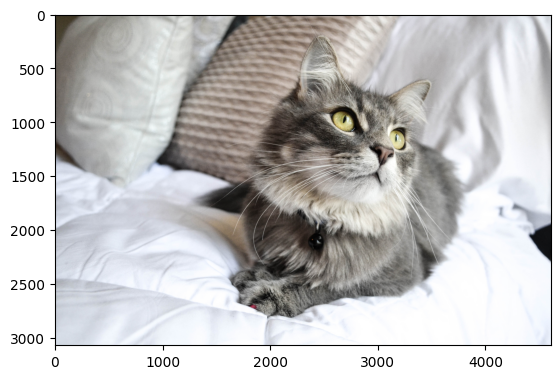

Predicting caption for cat on floor.jpg
Prediction Caption: kitten laying near a street <end>


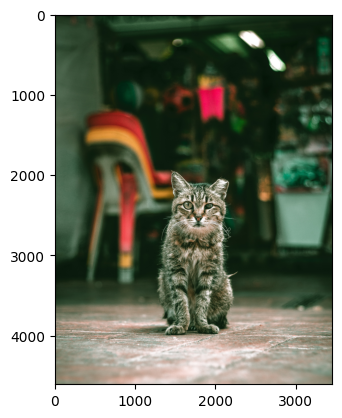

Predicting caption for cookie and croissant.jpg
Prediction Caption: plates of food set out of food and orange bread and a glasses of food set out on a table with eggs toast potatoes and an two slices of food and an a vegetable sandwich and <unk> glasses and a very small fork<end> and a basket of food


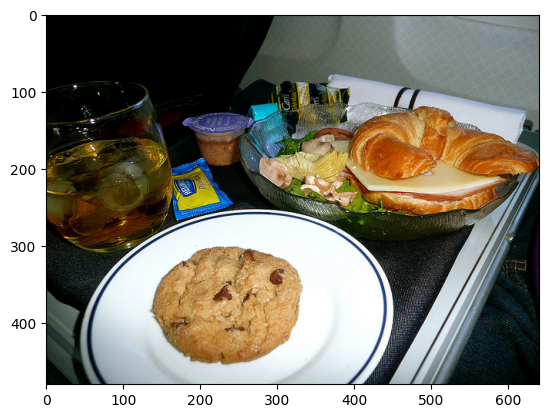

Predicting caption for creamy cake.jpg
Prediction Caption: bitten into <unk> <end>


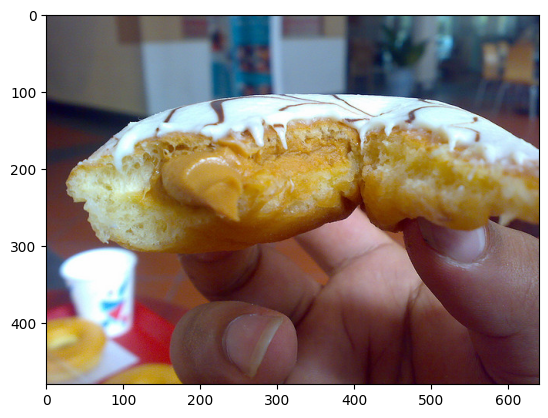

Predicting caption for death wild.jpg
Prediction Caption: bowl with three set of many bunches of three bananas and an orange <end>


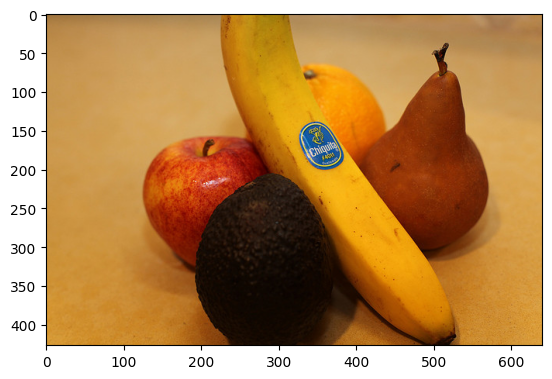

Predicting caption for dog_surf.jpg
Prediction Caption: dog on a frisbee <end>


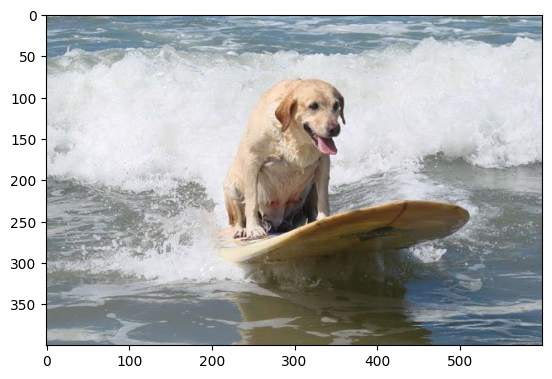

Predicting caption for elephant and zebras.jpg
Prediction Caption: elephant with the young elephant <end>


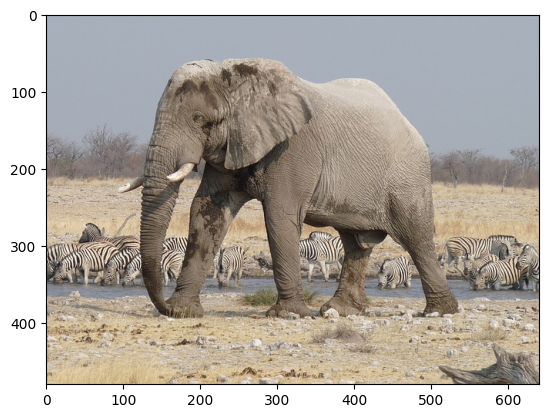

Predicting caption for elephants on field.jpg
Prediction Caption: elephant standing next to a car<end> elephant and eating some green trees <end>


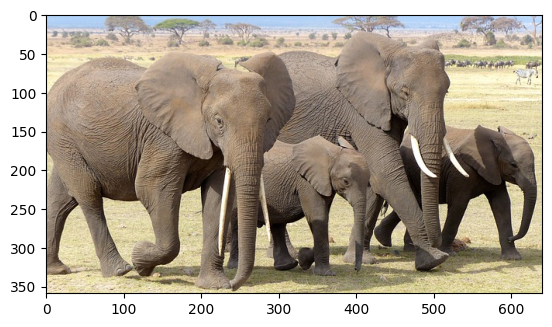

Predicting caption for elephants water.jpg
Prediction Caption: of baby elephants <end>


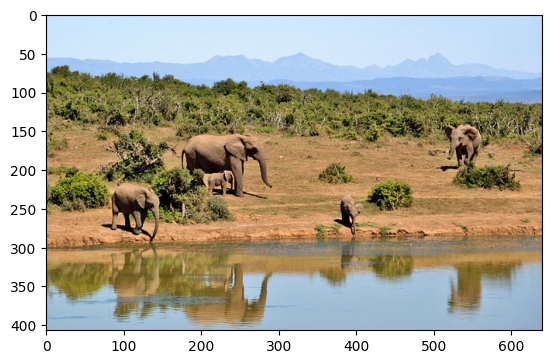

Predicting caption for family_on_bike.jpg
Prediction Caption: man is riding on the back of a motorcycle <end>


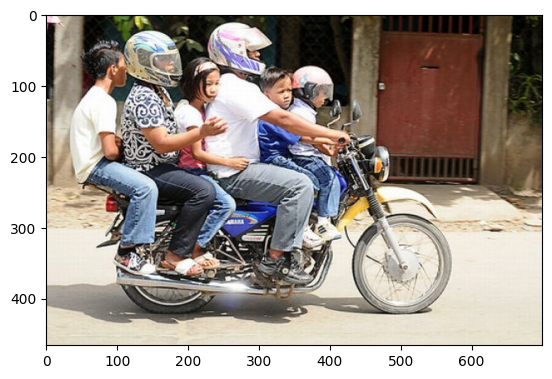

Predicting caption for four cows.jpeg
Prediction Caption: wire fence looking at a field <end>


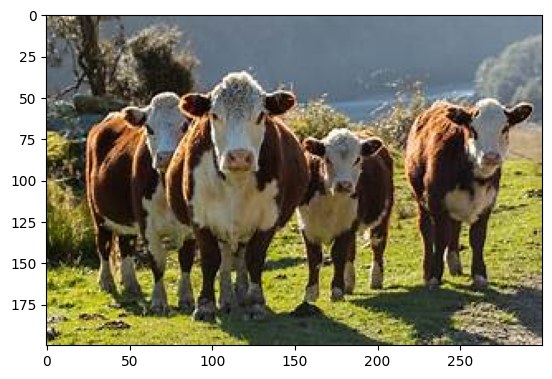

Predicting caption for fruits.jpeg
Prediction Caption: is a man in a room <end>


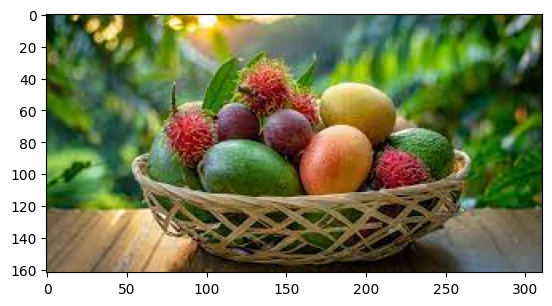

Predicting caption for fruits_basket.jpeg
Prediction Caption: pile of bananas are laying on a green apple and a green carrots and <unk> wooden railings <end>


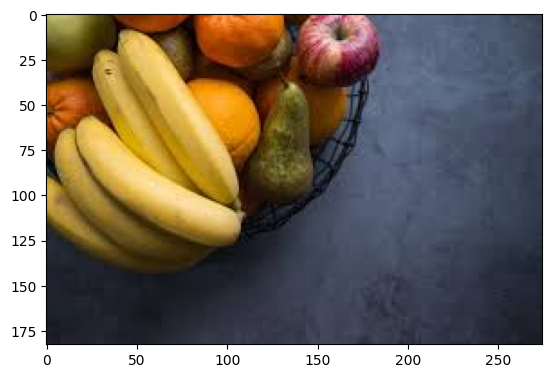

Predicting caption for girafe.jpeg
Prediction Caption: giraffes ride on a field <end>


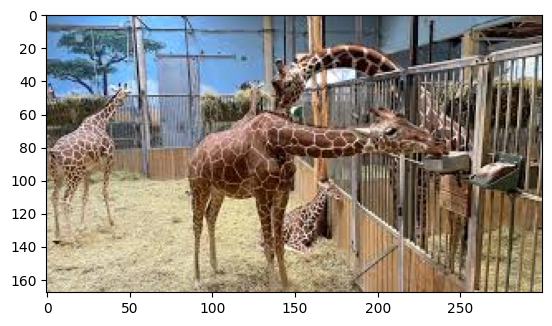

Predicting caption for girl on poney.jpeg
Prediction Caption: picture of two boy by a brown horse while an adult horse <end>


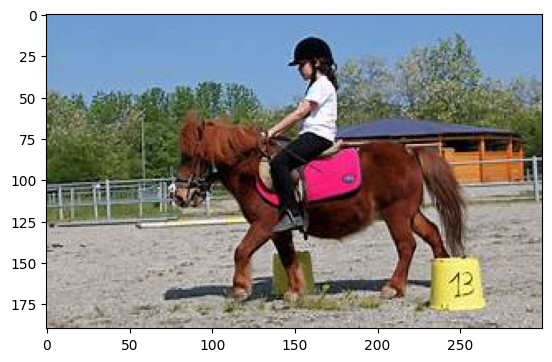

Predicting caption for girl_tennis.jpg
Prediction Caption: woman standing on a hard surface of a racket<end> down holding a racquet <end>


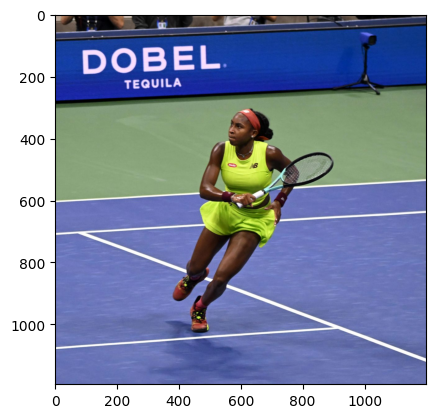

Predicting caption for gyrafe-zebra.jpg
Prediction Caption: herd of giraffe and its tail <end>


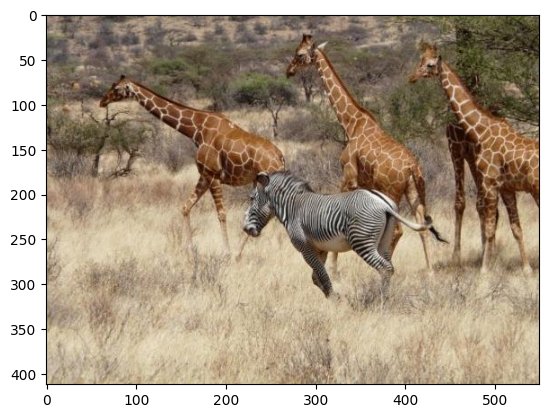

Predicting caption for horse and man.jpeg
Prediction Caption: black and white horse in <unk> time black and some food<end> <unk> around another while another man and a horse in front of a horse in front of a horse while another man walks a group of horses in front of a horse in a horse outside while


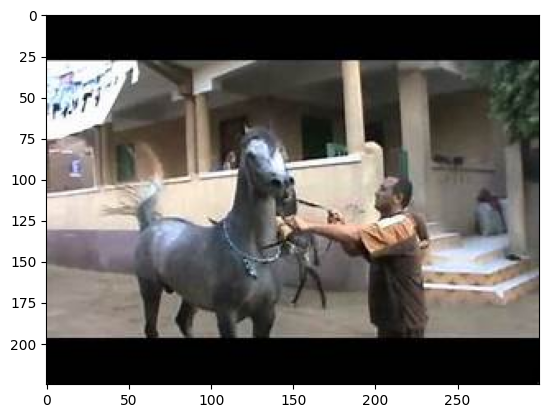

Predicting caption for kids winter.jpg
Prediction Caption: group of people with many people with their coach are walking with people with people with people with people with people with people with people with umbrellas <end>


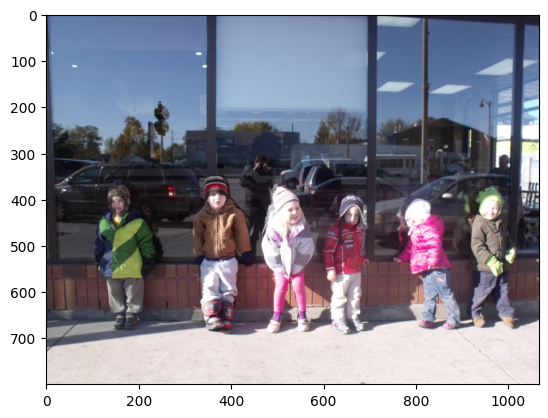

Predicting caption for mom_son_ski.jpeg
Prediction Caption: skier in a snow skier in a red jacket snow skis with ski slope <end>


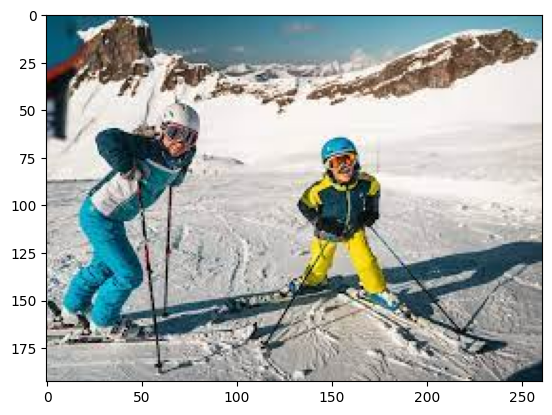

Predicting caption for people under rain.jpg
Prediction Caption: man in a sky <unk> skateboard<end> is standing in the city street as is holding onto a basket as a man in a street <unk> a woman is standing in the city street holding a ramp is on a skateboard<end> ramp <end>


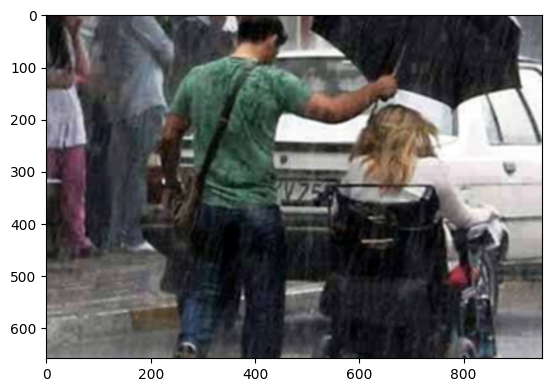

Predicting caption for pizza and glass of beer.jpg
Prediction Caption: plate and a large cheese and small white plate of orange and small white plate is on a table<end> and some berries and some many <unk> <unk> <end>


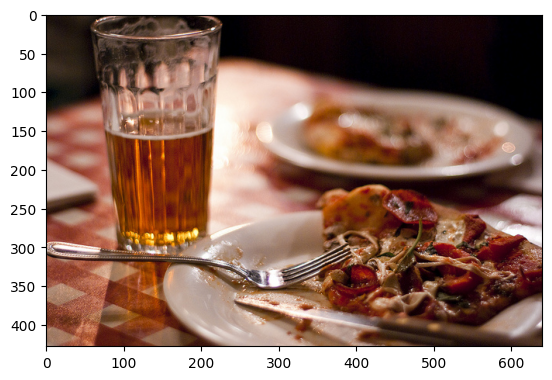

Predicting caption for pizza on hand.jpg
Prediction Caption: pizza that is cooking with lots of broccoli in a pot with cheese <end>


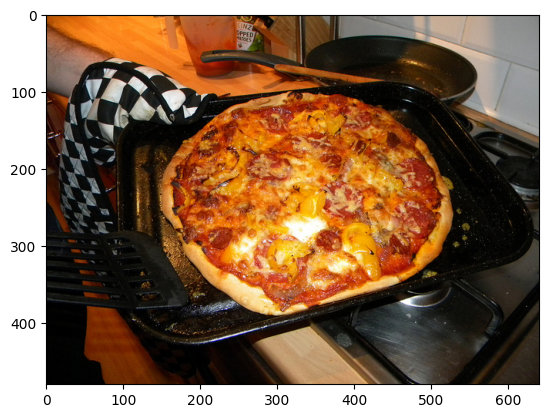

Predicting caption for pizza.jpg
Prediction Caption: pizza inside of a few toppings on it on foil <end>


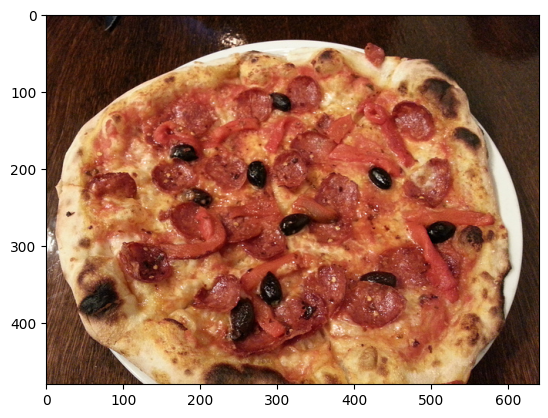

Predicting caption for plate stuffed with food.jpg
Prediction Caption: plate of food has plates of foods that are on plate <end>


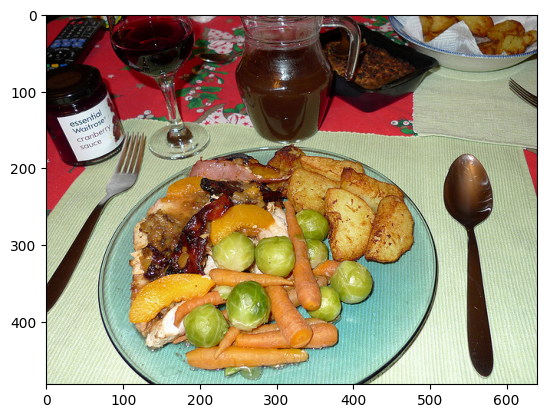

Predicting caption for poney drinking.jpeg
Prediction Caption: woman riding a horse statue <end>


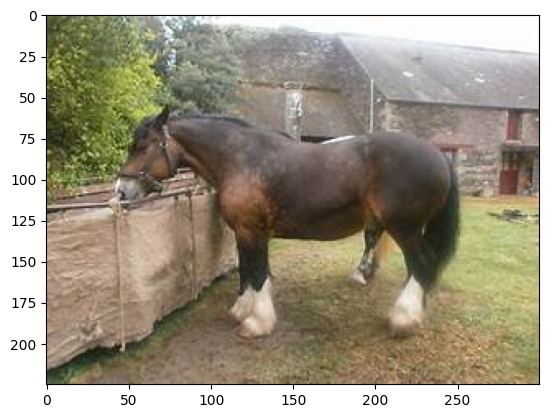

Predicting caption for red bus.jpg
Prediction Caption: double decker bus that is riding near a lot <end>


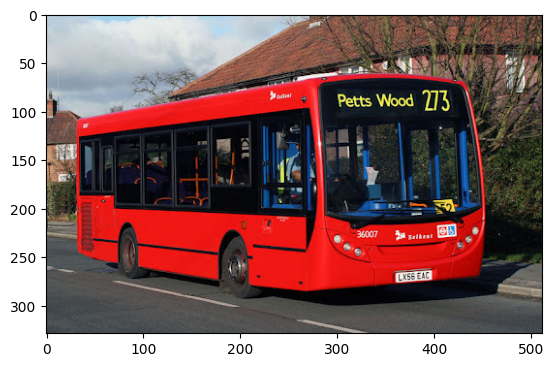

Predicting caption for Road621.jpg
Prediction Caption: group of people walking and trucks and taxi buses trucks and trucks and trucks and trucks and buses trucks and trucks and taxi buses trucks and buses and buses trucks and buses trucks and trucks and trucks and trucks and taxi cab driving down the rain <end>


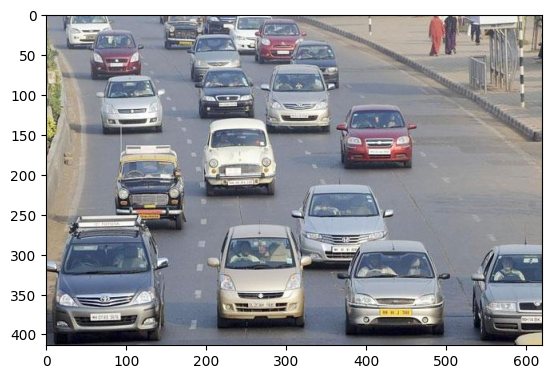

Predicting caption for roger_federer.jpeg
Prediction Caption: professional tennis player playing tennis <end>


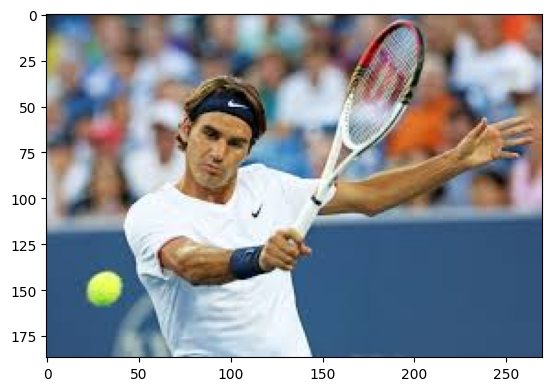

Predicting caption for ski_man.jpg
Prediction Caption: in blue jacket in the snow<end> on a bar on some skis on some skis and ice is on a slope as people that is skiing in the snow <end>


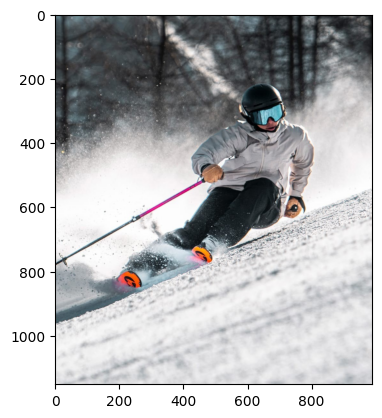

Predicting caption for snowboard-big-air-jump.jpg
Prediction Caption: person jumping over a snow board <end>


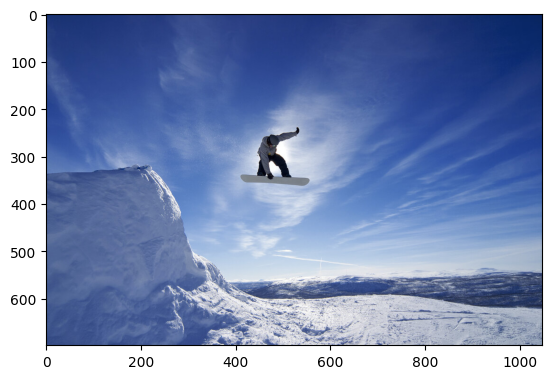

Predicting caption for snowboard_girl.jpg
Prediction Caption: man is going down a snow board a snow board in the snow skis looking in the snow skis is jumping a snow covered slope <end>


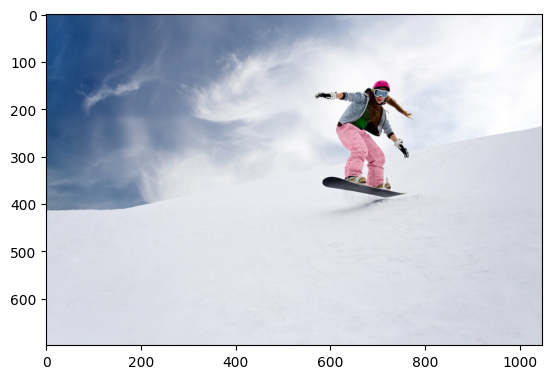

Predicting caption for sports-–-tennis.jpg
Prediction Caption: tennis racquet <end>


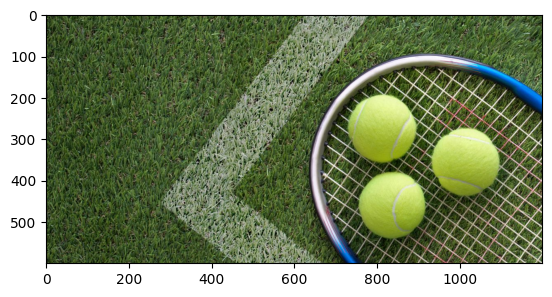

Predicting caption for stage-surf-tibau-do-sul-adekua-bresil-5.jpg
Prediction Caption: boarder is on a surf board <end>


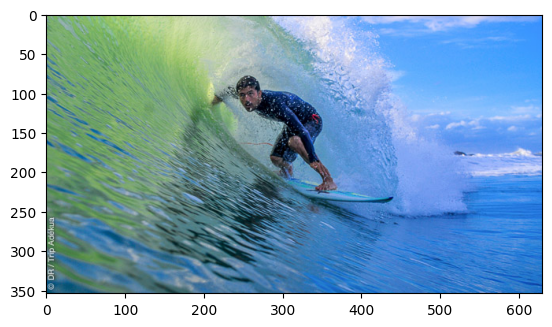

Predicting caption for surf walking.jpg
Prediction Caption: man in a wet suit water with a white frisbee <end>


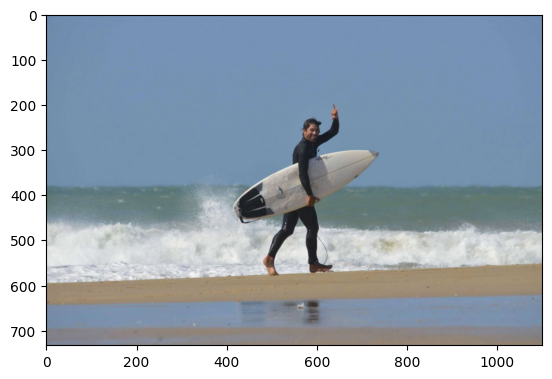

Predicting caption for surf_woman.jpeg
Prediction Caption: group of surfers enjoying some people in the water<end> ski board on top of a surf boards <end>


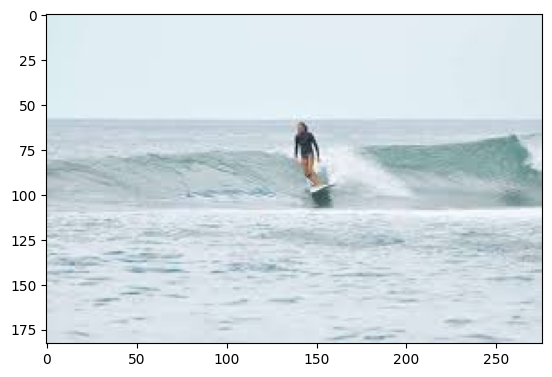

Predicting caption for trucks.jpg
Prediction Caption: white delta blue truck parked on the bed <end>


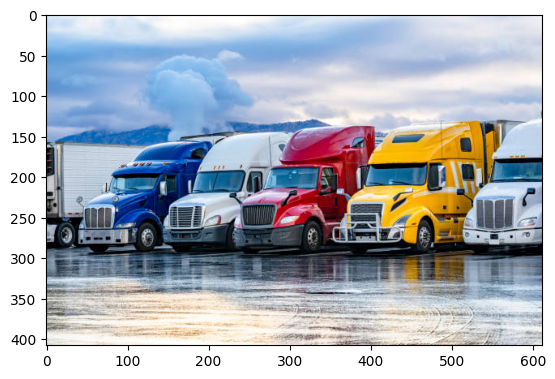

Predicting caption for two sheep.jpg
Prediction Caption: couple of sheep eating together in some huts <end>


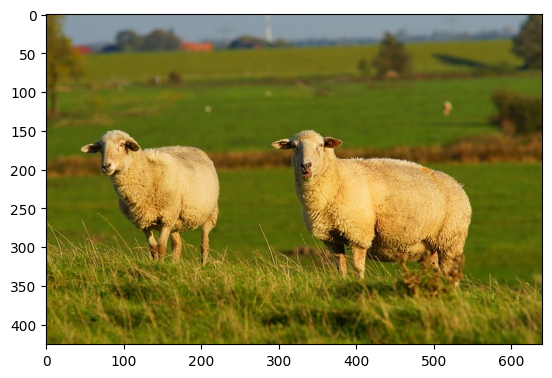

Predicting caption for washing_fruits.jpeg
Prediction Caption: chopping board 
<end> in an orange shirt <end>


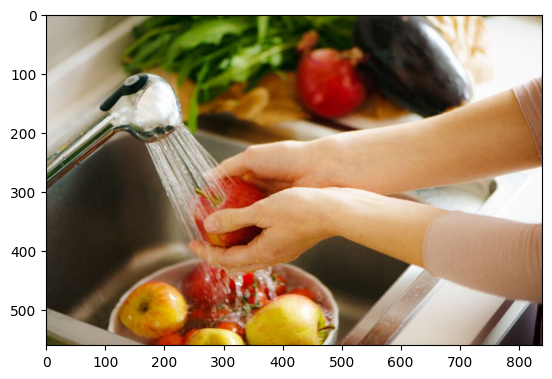

Predicting caption for white cow.jpeg
Prediction Caption: cow eating a wire fence <end>


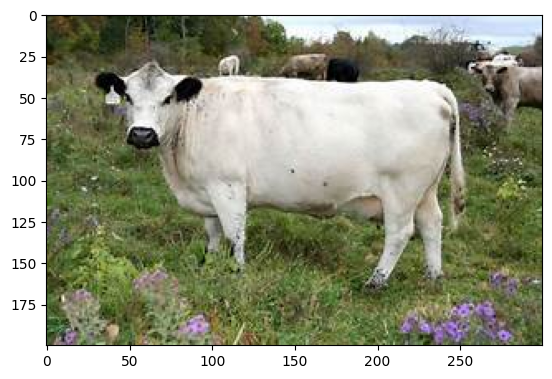

Predicting caption for white sheep.jpg
Prediction Caption: white sheep with a baby sheep <end>


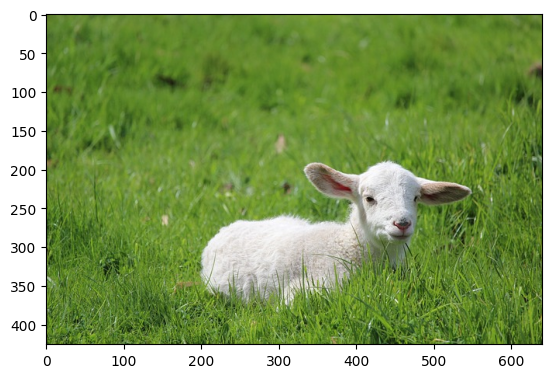

Predicting caption for zebras_drinking.jpg
Prediction Caption: close up of tall grass <end>


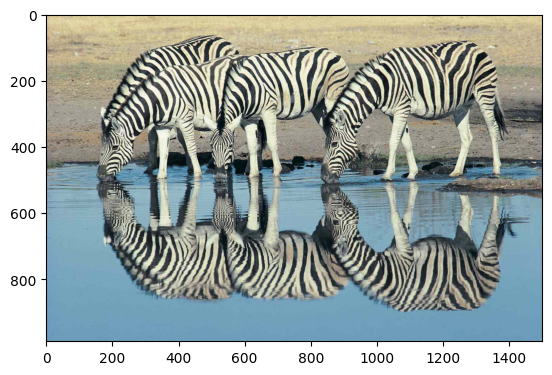

In [34]:
import os

directory_path = "data"
for filename in os.listdir(directory_path):
    if filename.endswith((".jpg","jpeg")):  # or any other file extension
        image_path = os.path.join(directory_path, filename)
        print(f"Predicting caption for {filename}")
        evaluate_image_from_path(image_path)

In [35]:
%pip install sentence_transformers

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [37]:
import sentence_transformers
from sentence_transformers import SentenceTransformer, util
from shutil import copy2
import os

model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

def classify_caption(caption):
    caption_embedding = model.encode([caption])
    
    similarities = util.pytorch_cos_sim(caption_embedding, category_embeddings)[0]
    
    highest_score_index = similarities.argmax()
    return categories[highest_score_index.item()]  

def classify_and_organize_images_semantic(directory_path, target_dir):
    for filename in os.listdir(directory_path):
        if filename.lower().endswith((".jpg", ".jpeg")):  
            image_path = os.path.join(directory_path, filename)
            print(f"Processing {filename}")
            
            result = evaluate(image_path)  
            caption = ' '.join(result) if isinstance(result, list) else result  
            
            predicted_category = classify_caption(caption)
            
            print(f"Caption: '{caption}'")
            print(f"Predicted category: {predicted_category}")

            category_dir = os.path.join(target_dir, predicted_category)
            os.makedirs(category_dir, exist_ok=True)
            destination_path = os.path.join(category_dir, filename)
            copy2(image_path, destination_path)
            print(f"Copied {filename} to {destination_path}")


categories = ["cat,kitten", "elephant,elephants", "zebra,zebras", "cow,cows", "sheep", "surf,beach", "horse", "man,woman,boy,girl,child", "giraffe", "vehicle,car", "fruit,fruits", "ski", "meal,food", "tennis"]

category_embeddings = model.encode(categories)


source_directory = "data2"  
target_directory = "classified_images_semantic"  
classify_and_organize_images_semantic(source_directory, target_directory)



Processing boy and winnie.jpg
Caption: 'smiling woman in a restaurant remote <end>'
Predicted category: meal,food
Copied boy and winnie.jpg to classified_images_semantic\meal,food\boy and winnie.jpg
Processing bus.jpg
Caption: 'old bus driving down a road <end>'
Predicted category: vehicle,car
Copied bus.jpg to classified_images_semantic\vehicle,car\bus.jpg
Processing cake.jpg
Caption: 'piece of cake that contains slices of pizza over a metal pan <end>'
Predicted category: meal,food
Copied cake.jpg to classified_images_semantic\meal,food\cake.jpg
Processing cakee.jpg
Caption: 'breakfast plat with snow board <end>'
Predicted category: meal,food
Copied cakee.jpg to classified_images_semantic\meal,food\cakee.jpg
Processing cake_chocolate.jpg
Caption: 'chicken and couple of sandwiches and fruit and a small white frosting and ice cream with a couple of sandwiches and strange <end>'
Predicted category: meal,food
Copied cake_chocolate.jpg to classified_images_semantic\meal,food\cake_chocolate